In [1]:
!nvidia-smi

Fri Jun 30 12:15:54 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
from helper_functions import *

In [3]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip

--2023-06-30 12:15:59--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.79.128, 108.177.119.128, 108.177.126.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.79.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: ‘101_food_classes_10_percent.zip’

101_food_classes_10 100%[===================>]   1.51G  42.4MB/s    in 38s     

2023-06-30 12:16:37 (40.9 MB/s) - ‘101_food_classes_10_percent.zip’ saved [1625420029/1625420029]



In [4]:
unzip_data('/content/101_food_classes_10_percent.zip')

In [5]:
walk_through_dir('/content/101_food_classes_10_percent')

There are 2 directories and 0 images in '/content/101_food_classes_10_percent'.
There are 101 directories and 0 images in '/content/101_food_classes_10_percent/test'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/tacos'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/macarons'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/eggs_benedict'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/cheese_plate'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/onion_rings'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/french_onion_soup'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/breakfast_burrito'.
There are 0 directories and 250 images in '/content/101_food_classes_10_percent/test/chocolate_mousse'.
There are 0 directories and 25

In [6]:
train_dir='/content/101_food_classes_10_percent/train/'
test_dir='/content/101_food_classes_10_percent/test/'

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

In [8]:
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import *
from tensorflow.keras.preprocessing import image_dataset_from_directory

In [9]:
IMG_SIZE=(224,224)

In [10]:
train_data=image_dataset_from_directory(directory=train_dir,
                                        label_mode='categorical',
                                        image_size=IMG_SIZE)

test_data=image_dataset_from_directory(directory=test_dir,
                                        label_mode='categorical',
                                        image_size=IMG_SIZE,
                                        shuffle=False)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


In [11]:
checkpoint_path='101_classes_10_percent_data_model_checkpoint'

checkpoint_callback=tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                       save_weights_only=True,
                                                       monitor='val_accuracy',
                                                       save_best_only=True)

In [12]:
from tensorflow.keras.layers.experimental import preprocessing

In [13]:
data_augmentation=Sequential([
    preprocessing.RandomFlip('horizontal'),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
], name='data_augmentation')

In [14]:
from keras.layers.pooling.global_average_pooling1d import GlobalAveragePooling1D
base_model=tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable=False

inputs=Input(shape=(224,224,3),name='input_layer')

x=data_augmentation(inputs)
x=base_model(x,training=False)
x=GlobalAveragePooling2D(name='global_avg_pool_layer')(x)

outputs=Dense(units=len(train_data.class_names),activation='softmax',name='output_layer')(x)

model=Model(inputs=inputs,outputs=outputs)

16705208/16705208 [==============================] - 1s 0us/step


In [15]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, None, None, 3)    0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 129,381
Non-trainab

In [16]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(),
              metrics=['accuracy'])

In [17]:
history=model.fit(train_data,
                  epochs=5,
                  validation_data=test_data,
                  validation_steps=int(0.15*len(test_data)),
                  callbacks=[checkpoint_callback])

Epoch 1/5
237/237 [==============================] - 117s 429ms/step - loss: 3.3525 - accuracy: 0.2779 - val_loss: 2.5132 - val_accuracy: 0.4454
Epoch 2/5
237/237 [==============================] - 77s 322ms/step - loss: 2.1897 - accuracy: 0.5006 - val_loss: 2.0639 - val_accuracy: 0.5024
Epoch 3/5
237/237 [==============================] - 64s 267ms/step - loss: 1.8298 - accuracy: 0.5583 - val_loss: 1.9037 - val_accuracy: 0.5196
Epoch 4/5
237/237 [==============================] - 65s 271ms/step - loss: 1.6088 - accuracy: 0.5996 - val_loss: 1.8315 - val_accuracy: 0.5270
Epoch 5/5
237/237 [==============================] - 57s 238ms/step - loss: 1.4439 - accuracy: 0.6511 - val_loss: 1.7843 - val_accuracy: 0.5312


In [18]:
fine_tuning_results=model.evaluate(test_data)

790/790 [==============================] - 63s 80ms/step - loss: 1.5981 - accuracy: 0.5784


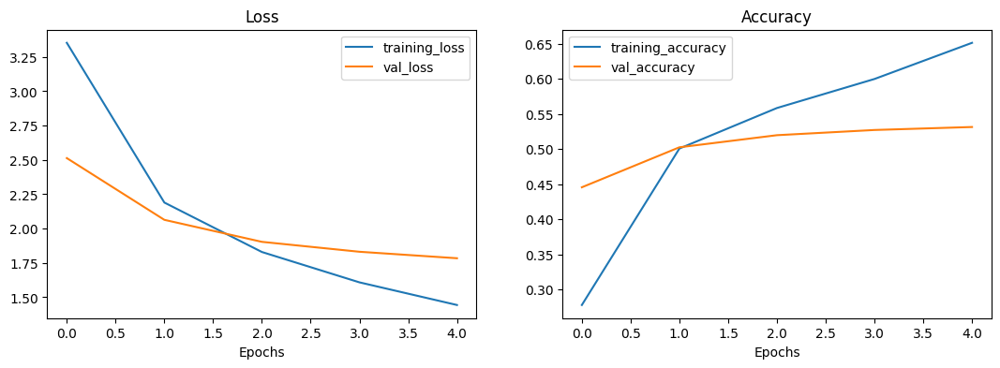

In [19]:
plot_loss_curves(history)

In [20]:
history.history

{'loss': [3.352511405944824,
  2.1897287368774414,
  1.8297830820083618,
  1.6087827682495117,
  1.4439135789871216],
 'accuracy': [0.2778877913951874,
  0.5005940794944763,
  0.558283805847168,
  0.5996039509773254,
  0.6510891318321228],
 'val_loss': [2.513190269470215,
  2.0638957023620605,
  1.903715968132019,
  1.831498384475708,
  1.7843068838119507],
 'val_accuracy': [0.44544491171836853,
  0.5023834705352783,
  0.5195974707603455,
  0.5270127058029175,
  0.53125]}

In [21]:
base_model.trainable=True

for layer in base_model.layers[:-5]:
  layer.trainable=False

In [22]:
for layer_number,layer in enumerate(model.layers[2].layers):
  print(layer_number,layer.name,layer.trainable)

0 input_1 False
1 rescaling False
2 normalization False
3 rescaling_1 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze False
39

In [23]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
              metrics=['accuracy'])

In [24]:
fine_tune_epochs=10

In [25]:
history_fine_tuned=model.fit(train_data,
                             epochs=fine_tune_epochs,
                             validation_data=test_data,
                             validation_steps=int(0.15*len(test_data)),
                             initial_epoch=history.epoch[-1])

Epoch 5/10
237/237 [==============================] - 68s 242ms/step - loss: 1.2128 - accuracy: 0.6830 - val_loss: 1.7551 - val_accuracy: 0.5405
Epoch 6/10
237/237 [==============================] - 52s 218ms/step - loss: 1.0975 - accuracy: 0.7068 - val_loss: 1.7462 - val_accuracy: 0.5482
Epoch 7/10
237/237 [==============================] - 53s 222ms/step - loss: 1.0063 - accuracy: 0.7237 - val_loss: 1.7523 - val_accuracy: 0.5466
Epoch 8/10
237/237 [==============================] - 49s 206ms/step - loss: 0.9407 - accuracy: 0.7485 - val_loss: 1.7513 - val_accuracy: 0.5482
Epoch 9/10
237/237 [==============================] - 49s 207ms/step - loss: 0.9003 - accuracy: 0.7525 - val_loss: 1.7504 - val_accuracy: 0.5477
Epoch 10/10
237/237 [==============================] - 48s 200ms/step - loss: 0.8367 - accuracy: 0.7721 - val_loss: 1.7316 - val_accuracy: 0.5508


In [26]:
fine_tuning_results2=model.evaluate(test_data)
fine_tuning_results2

790/790 [==============================] - 73s 92ms/step - loss: 1.5123 - accuracy: 0.6007


[1.512261152267456, 0.6007128953933716]

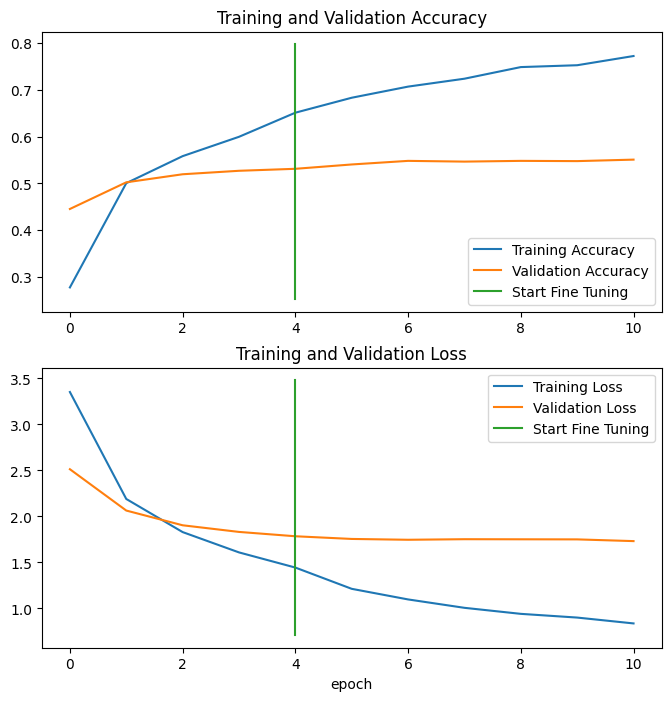

In [27]:
compare_historys(original_history=history,
                 new_history=history_fine_tuned)

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [29]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip

--2023-06-30 12:33:39--  https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.127.128, 172.217.218.128, 142.251.31.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.127.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46760742 (45M) [application/zip]
Saving to: ‘06_101_food_class_10_percent_saved_big_dog_model.zip’

06_101_food_class_1 100%[===================>]  44.59M  21.0MB/s    in 2.1s    

2023-06-30 12:33:41 (21.0 MB/s) - ‘06_101_food_class_10_percent_saved_big_dog_model.zip’ saved [46760742/46760742]



In [30]:
unzip_data('/content/06_101_food_class_10_percent_saved_big_dog_model.zip')

In [31]:
loaded_model=tf.keras.models.load_model('/content/06_101_food_class_10_percent_saved_big_dog_model')

In [32]:
results=loaded_model.evaluate(test_data)

790/790 [==============================] - 74s 91ms/step - loss: 1.8027 - accuracy: 0.6078


In [33]:
pred_probs=model.predict(test_data,verbose=1)

790/790 [==============================] - 70s 87ms/step


In [34]:
len(pred_probs)

25250

In [35]:
pred_probs.shape

(25250, 101)

In [36]:
pred_probs[:10]

array([[1.3737485e-01, 9.2996401e-04, 1.2475100e-01, ..., 1.5226404e-05,
        1.6520141e-02, 1.6345825e-02],
       [9.4810164e-01, 1.6782844e-08, 2.2251224e-03, ..., 2.7931905e-03,
        2.2814623e-07, 1.4133409e-06],
       [5.8037543e-01, 1.6887296e-02, 1.1474848e-02, ..., 1.4117661e-04,
        4.2065518e-04, 1.3052403e-03],
       ...,
       [1.7467132e-01, 1.2374867e-05, 1.3335828e-03, ..., 3.1816453e-02,
        1.1654885e-03, 4.7734826e-05],
       [1.2882249e-01, 6.2060176e-04, 2.1376659e-01, ..., 8.8397253e-05,
        2.8258053e-04, 1.9463658e-04],
       [6.0982013e-01, 4.7062204e-07, 9.0593146e-04, ..., 3.9000672e-03,
        3.1321247e-06, 7.9494779e-04]], dtype=float32)

In [37]:
pred_probs[0]

array([1.37374848e-01, 9.29964008e-04, 1.24751002e-01, 7.01252645e-07,
       1.59280189e-05, 4.05442506e-06, 1.43595447e-04, 4.36547998e-06,
       5.02046272e-02, 3.80436541e-04, 1.20768266e-06, 8.71475095e-06,
       4.46967839e-04, 2.41131943e-07, 3.74067458e-03, 1.38209481e-03,
       1.69762243e-05, 9.01410473e-04, 3.80066875e-03, 3.83998013e-05,
       6.93676993e-04, 1.36510344e-05, 2.95160979e-04, 2.12441242e-04,
       8.18017230e-04, 4.42386745e-03, 1.04340026e-03, 9.81405756e-05,
       1.56163543e-01, 1.27572380e-03, 1.16506526e-05, 1.12388597e-03,
       3.39994644e-04, 3.62429796e-06, 1.27203232e-02, 1.21426738e-05,
       2.05588236e-04, 2.89509073e-03, 6.57971501e-02, 8.40079229e-05,
       6.33491320e-04, 1.88146741e-03, 5.03678457e-04, 9.08487254e-06,
       5.63498688e-05, 2.30949736e-05, 1.00507832e-03, 4.65752702e-04,
       2.46584455e-06, 1.46611869e-01, 6.26585155e-04, 1.81926152e-04,
       6.28491342e-02, 3.00528780e-02, 1.12139620e-04, 1.38072930e-02,
      

In [38]:
len(pred_probs[0])

101

In [39]:
pred_classes=pred_probs.argmax(axis=1)
pred_classes[:10]

array([28,  0,  0,  8,  8, 78, 29, 72,  9,  0])

In [40]:
test_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

In [41]:
y_labels=[]

for images,labels in test_data.unbatch():
  y_labels.append(labels.numpy().argmax())

print(y_labels[:10])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [42]:
results

[1.8027206659317017, 0.6077623963356018]

In [43]:
from sklearn.metrics import accuracy_score,classification_report

In [44]:
accuracy=accuracy_score(y_labels,pred_classes)
accuracy

0.6007128712871287

In [45]:
np.isclose(results[1],accuracy)

False

In [46]:
class_names=test_data.class_names
class_names

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

In [47]:
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  plt.xticks(rotation=70,fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [48]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(100,100),
                      text_size=20)

In [49]:
print(classification_report(y_labels,pred_classes))

              precision    recall  f1-score   support

           0       0.28      0.18      0.22       250
           1       0.48      0.77      0.59       250
           2       0.71      0.57      0.63       250
           3       0.87      0.57      0.69       250
           4       0.60      0.38      0.46       250
           5       0.51      0.39      0.44       250
           6       0.73      0.75      0.74       250
           7       0.87      0.74      0.80       250
           8       0.21      0.64      0.31       250
           9       0.39      0.70      0.50       250
          10       0.54      0.42      0.47       250
          11       0.82      0.54      0.66       250
          12       0.65      0.60      0.62       250
          13       0.58      0.53      0.55       250
          14       0.66      0.51      0.58       250
          15       0.45      0.35      0.39       250
          16       0.68      0.50      0.58       250
          17       0.34    

In [50]:
classification_report_dict=classification_report(y_labels,pred_classes,output_dict=True)
classification_report_dict

{'0': {'precision': 0.27848101265822783,
  'recall': 0.176,
  'f1-score': 0.2156862745098039,
  'support': 250},
 '1': {'precision': 0.48120300751879697,
  'recall': 0.768,
  'f1-score': 0.5916795069337443,
  'support': 250},
 '2': {'precision': 0.7114427860696517,
  'recall': 0.572,
  'f1-score': 0.6341463414634146,
  'support': 250},
 '3': {'precision': 0.8666666666666667,
  'recall': 0.572,
  'f1-score': 0.689156626506024,
  'support': 250},
 '4': {'precision': 0.5987261146496815,
  'recall': 0.376,
  'f1-score': 0.4619164619164619,
  'support': 250},
 '5': {'precision': 0.5132275132275133,
  'recall': 0.388,
  'f1-score': 0.44191343963553537,
  'support': 250},
 '6': {'precision': 0.7258687258687259,
  'recall': 0.752,
  'f1-score': 0.7387033398821218,
  'support': 250},
 '7': {'precision': 0.8685446009389671,
  'recall': 0.74,
  'f1-score': 0.7991360691144708,
  'support': 250},
 '8': {'precision': 0.2056921086675291,
  'recall': 0.636,
  'f1-score': 0.31085043988269795,
  'suppor

In [51]:
class_f1_scores={}

for k,v in classification_report_dict.items():

  if k=='accuracy':
    break
  else:
    class_f1_scores[class_names[int(k)]]=v['f1-score']

class_f1_scores

{'apple_pie': 0.2156862745098039,
 'baby_back_ribs': 0.5916795069337443,
 'baklava': 0.6341463414634146,
 'beef_carpaccio': 0.689156626506024,
 'beef_tartare': 0.4619164619164619,
 'beet_salad': 0.44191343963553537,
 'beignets': 0.7387033398821218,
 'bibimbap': 0.7991360691144708,
 'bread_pudding': 0.31085043988269795,
 'breakfast_burrito': 0.5007112375533428,
 'bruschetta': 0.4705882352941176,
 'caesar_salad': 0.655421686746988,
 'cannoli': 0.6224066390041493,
 'caprese_salad': 0.5546218487394958,
 'carrot_cake': 0.5752808988764045,
 'ceviche': 0.3936651583710407,
 'cheese_plate': 0.5760368663594471,
 'cheesecake': 0.41358024691358025,
 'chicken_curry': 0.5,
 'chicken_quesadilla': 0.6638477801268499,
 'chicken_wings': 0.7058823529411765,
 'chocolate_cake': 0.5559701492537313,
 'chocolate_mousse': 0.3669064748201439,
 'churros': 0.7301587301587301,
 'clam_chowder': 0.722466960352423,
 'club_sandwich': 0.6858316221765913,
 'crab_cakes': 0.37613019891500904,
 'creme_brulee': 0.7745901639

In [52]:
f1_scores=pd.DataFrame({'class_name':list(class_f1_scores.keys()),'f1-score':list(class_f1_scores.values())}).sort_values(by='f1-score',ascending=False)

In [53]:
f1_scores

,class_name,f1-score
33,edamame,0.959064
63,macarons,0.881720
75,pho,0.856604
69,oysters,0.856557
54,hot_and_sour_soup,0.849699
...,...,...
8,bread_pudding,0.310850
93,steak,0.288793
39,foie_gras,0.279070
77,pork_chop,0.245431


[]

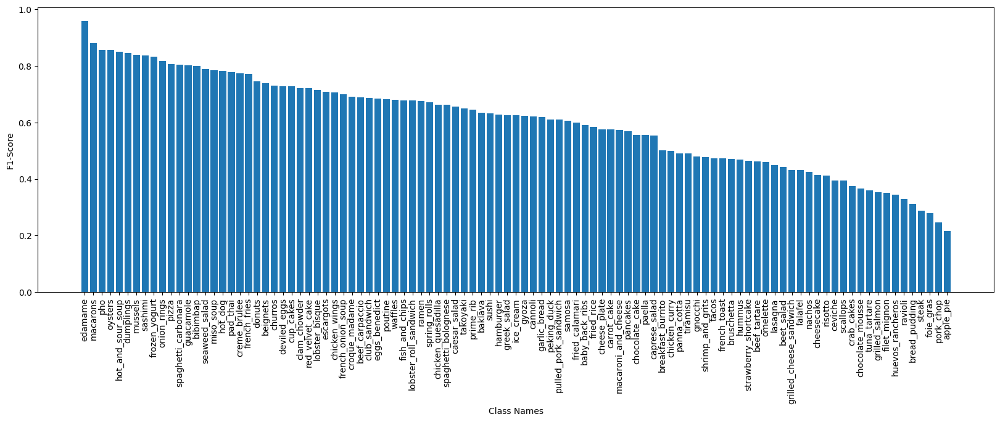

In [54]:
plt.figure(figsize=(20,6))
plt.bar(f1_scores['class_name'],f1_scores['f1-score'])
plt.xticks(rotation='vertical')
plt.xlabel('Class Names')
plt.ylabel('F1-Score')
plt.plot()

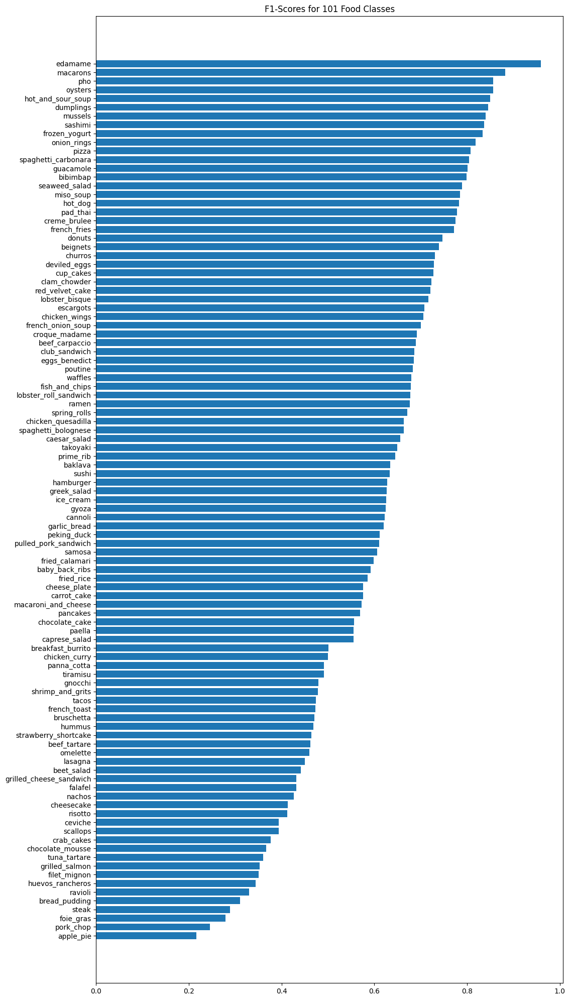

In [55]:
fig,ax=plt.subplots(figsize=(12,25))
scores=ax.barh(range(len(f1_scores)),f1_scores['f1-score'].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores['class_name'])
ax.set_label('F1-Scores')
ax.set_title('F1-Scores for 101 Food Classes')
ax.invert_yaxis()
plt.show()

In [56]:
def load_and_prep_image(filename,img_shape=224,scale=True):

  img=tf.io.read_file(filename)

  img=tf.io.decode_image(img,channels=3)
  img=tf.image.resize(img,[img_shape,img_shape])

  if scale:
    return img/255.

  else:
    return img

In [57]:
f1_scores

,class_name,f1-score
33,edamame,0.959064
63,macarons,0.881720
75,pho,0.856604
69,oysters,0.856557
54,hot_and_sour_soup,0.849699
...,...,...
8,bread_pudding,0.310850
93,steak,0.288793
39,foie_gras,0.279070
77,pork_chop,0.245431


In [58]:
import os
import random

1/1 [==============================] - 0s 157ms/step


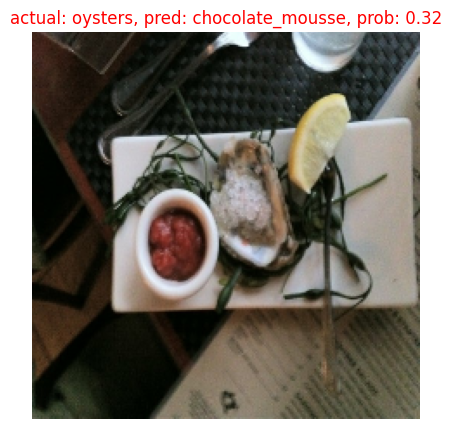

1/1 [==============================] - 0s 76ms/step


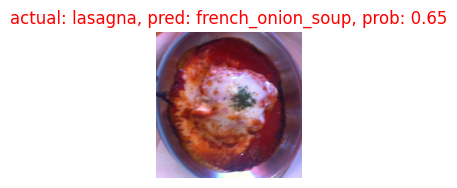

1/1 [==============================] - 0s 48ms/step


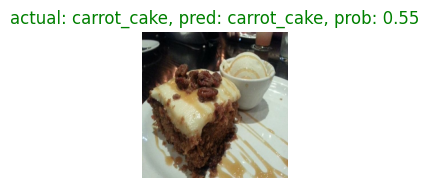

In [64]:
plt.figure(figsize=(17,10))

for i in range(3):

  class_name=random.choice(class_names)
  filename=random.choice(os.listdir(test_dir+'/'+class_name))
  filepath=test_dir+class_name+'/'+filename

  img=load_and_prep_image(filepath,scale=False)

  pred_prob=model.predict(tf.expand_dims(img,axis=0))
  pred_class=class_names[pred_prob.argmax()]

  # print(pred_prob)
  # print(pred_class)

  plt.subplot(1,3,i+1)
  plt.imshow(img/255.)

  if class_name==pred_class:
    title_color='g'
  else:
    title_color='r'

  plt.title(f'actual: {class_name}, pred: {pred_class}, prob: {pred_prob.max():.2f}',c=title_color)
  plt.axis('off')

  plt.show()

In [67]:
filepaths=[]

for filepath in test_data.list_files('/content/101_food_classes_10_percent/test/*/*.jpg',
                                     shuffle=False):

  filepaths.append(filepath.numpy())

In [68]:
filepaths[:10]

[b'/content/101_food_classes_10_percent/test/apple_pie/1011328.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/101251.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1034399.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/103801.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1038694.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1047447.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1068632.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/110043.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1106961.jpg',
 b'/content/101_food_classes_10_percent/test/apple_pie/1113017.jpg']

In [71]:
pred_df=pd.DataFrame({'img_path': filepaths,
                      'y_true': y_labels,
                      'y_pred': pred_classes,
                      'pred_conf': pred_probs.argmax(axis=1),
                      'y_true_class_names': [class_names[i] for i in y_labels],
                      'y_pred_class_names': [class_names[i] for i in pred_classes]})

pred_df

,img_path,y_true,y_pred,pred_conf,y_true_class_names,y_pred_class_names
0,b'/content/101_food_classes_10_percent/test/ap...,0,28,28,apple_pie,croque_madame
1,b'/content/101_food_classes_10_percent/test/ap...,0,0,0,apple_pie,apple_pie
2,b'/content/101_food_classes_10_percent/test/ap...,0,0,0,apple_pie,apple_pie
3,b'/content/101_food_classes_10_percent/test/ap...,0,8,8,apple_pie,bread_pudding
4,b'/content/101_food_classes_10_percent/test/ap...,0,8,8,apple_pie,bread_pudding
...,...,...,...,...,...,...
25245,b'/content/101_food_classes_10_percent/test/wa...,100,100,100,waffles,waffles
25246,b'/content/101_food_classes_10_percent/test/wa...,100,16,16,waffles,cheese_plate
25247,b'/content/101_food_classes_10_percent/test/wa...,100,100,100,waffles,waffles
25248,b'/content/101_food_classes_10_percent/test/wa...,100,94,94,waffles,strawberry_shortcake


In [72]:
pred_df['pred_correct']=pred_df['y_true']==pred_df['y_pred']
pred_df

,img_path,y_true,y_pred,pred_conf,y_true_class_names,y_pred_class_names,pred_correct
0,b'/content/101_food_classes_10_percent/test/ap...,0,28,28,apple_pie,croque_madame,False
1,b'/content/101_food_classes_10_percent/test/ap...,0,0,0,apple_pie,apple_pie,True
2,b'/content/101_food_classes_10_percent/test/ap...,0,0,0,apple_pie,apple_pie,True
3,b'/content/101_food_classes_10_percent/test/ap...,0,8,8,apple_pie,bread_pudding,False
4,b'/content/101_food_classes_10_percent/test/ap...,0,8,8,apple_pie,bread_pudding,False
...,...,...,...,...,...,...,...
25245,b'/content/101_food_classes_10_percent/test/wa...,100,100,100,waffles,waffles,True
25246,b'/content/101_food_classes_10_percent/test/wa...,100,16,16,waffles,cheese_plate,False
25247,b'/content/101_food_classes_10_percent/test/wa...,100,100,100,waffles,waffles,True
25248,b'/content/101_food_classes_10_percent/test/wa...,100,94,94,waffles,strawberry_shortcake,False


In [78]:
top_100_wrong=pred_df[pred_df['pred_correct']==False].sort_values(by='pred_conf',ascending=False)[:100]

In [79]:
top_100_wrong

,img_path,y_true,y_pred,pred_conf,y_true_class_names,y_pred_class_names,pred_correct
3041,b'/content/101_food_classes_10_percent/test/ca...,12,100,100,cannoli,waffles,False
3880,b'/content/101_food_classes_10_percent/test/ce...,15,100,100,ceviche,waffles,False
14429,b'/content/101_food_classes_10_percent/test/hu...,57,100,100,hummus,waffles,False
8746,b'/content/101_food_classes_10_percent/test/eg...,34,100,100,eggs_benedict,waffles,False
14444,b'/content/101_food_classes_10_percent/test/hu...,57,100,100,hummus,waffles,False
...,...,...,...,...,...,...,...
1022,b'/content/101_food_classes_10_percent/test/be...,4,99,99,beef_tartare,tuna_tartare,False
1131,b'/content/101_food_classes_10_percent/test/be...,4,99,99,beef_tartare,tuna_tartare,False
3968,b'/content/101_food_classes_10_percent/test/ce...,15,99,99,ceviche,tuna_tartare,False
4014,b'/content/101_food_classes_10_percent/test/ch...,16,99,99,cheese_plate,tuna_tartare,False


In [80]:
top_100_wrong[:20]

,img_path,y_true,y_pred,pred_conf,y_true_class_names,y_pred_class_names,pred_correct
3041,b'/content/101_food_classes_10_percent/test/ca...,12,100,100,cannoli,waffles,False
3880,b'/content/101_food_classes_10_percent/test/ce...,15,100,100,ceviche,waffles,False
14429,b'/content/101_food_classes_10_percent/test/hu...,57,100,100,hummus,waffles,False
8746,b'/content/101_food_classes_10_percent/test/eg...,34,100,100,eggs_benedict,waffles,False
14444,b'/content/101_food_classes_10_percent/test/hu...,57,100,100,hummus,waffles,False
14554,b'/content/101_food_classes_10_percent/test/ic...,58,100,100,ice_cream,waffles,False
2671,b'/content/101_food_classes_10_percent/test/br...,10,100,100,bruschetta,waffles,False
7609,b'/content/101_food_classes_10_percent/test/de...,30,100,100,deviled_eggs,waffles,False
7492,b'/content/101_food_classes_10_percent/test/cu...,29,100,100,cup_cakes,waffles,False
2195,b'/content/101_food_classes_10_percent/test/br...,8,100,100,bread_pudding,waffles,False


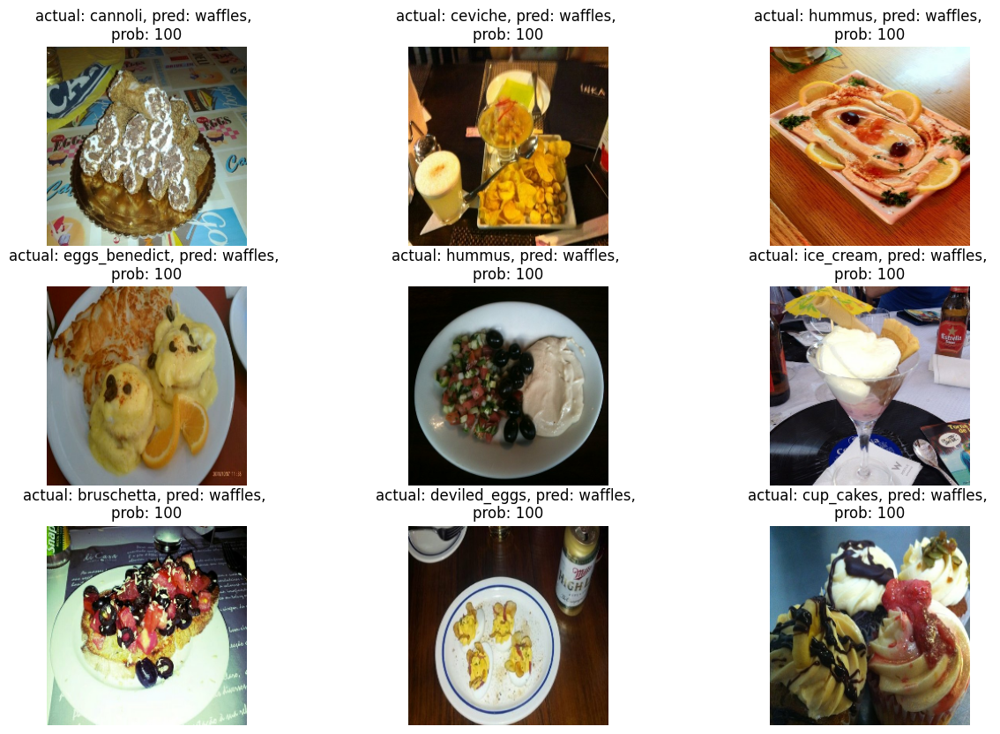

In [86]:
images_to_view=9
start_index=0

plt.figure(figsize=(15,10))

for i,row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
  plt.subplot(3,3,i+1)
  img=load_and_prep_image(row[1],scale=False)
  _,_,_,_,pred_probs,y_true_classname,y_pred_classname,_=row
  plt.imshow(img/255.)
  plt.title(f'actual: {y_true_classname}, pred: {y_pred_classname}, \nprob: {pred_probs}')
  plt.axis(False)


# images_to_view = 9
# start_index = 10 # change the start index to view more
# plt.figure(figsize=(15, 10))
# for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
#   plt.subplot(3, 3, i+1)
#   img = load_and_prep_image(row[1], scale=True)
#   _, _, _, _, pred_prob, y_true, y_pred, _ = row # only interested in a few parameters of each row
#   plt.imshow(img)
#   plt.title(f"actual: {y_true}, pred: {y_pred} \nprob: {pred_prob:.2f}")
#   plt.axis(False)

In [102]:
def predict(image_path,model):

  img=mpimg.imread(image_path)

  input_image=cv2.resize(img,(224,224))
  input_image=input_image.reshape(1,224,224,3)

  pred_prob=model.predict(input_image)
  pred_class=pred_prob.argmax()
  #.argmax(axis=1)[0]

  plt.imshow(img)
  plt.title(f'Prediction: {class_names[pred_class]}, prob: {pred_prob.max():.2f}')
  plt.axis(False)
  plt.show()

1/1 [==============================] - 0s 29ms/step


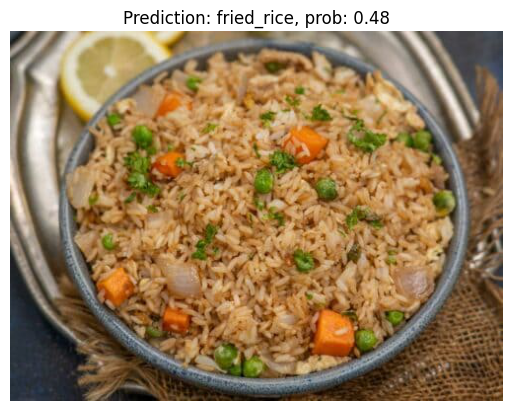

In [103]:
predict(image_path='/content/fried_rice.jpg',model=model)

1/1 [==============================] - 0s 26ms/step


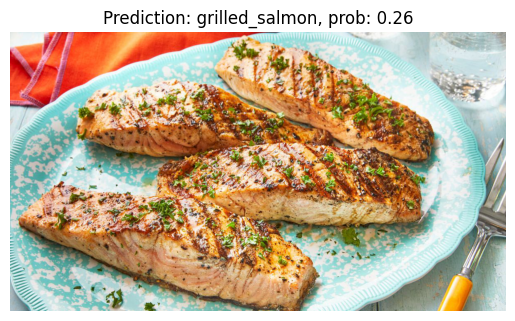

In [104]:
predict(image_path='/content/grilled_salmon.jpg',model=model)

1/1 [==============================] - 0s 52ms/step


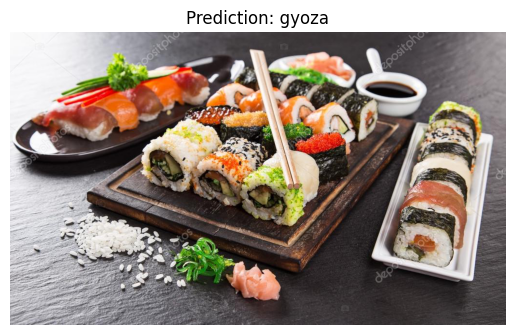

In [93]:
predict(image_path='/content/sushi2.jpg',model=model)

In [94]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

--2023-06-30 13:52:59--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.119.128, 108.177.126.128, 108.177.127.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.119.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: ‘custom_food_images.zip’

custom_food_images. 100%[===================>]  12.58M  12.9MB/s    in 1.0s    

2023-06-30 13:53:00 (12.9 MB/s) - ‘custom_food_images.zip’ saved [13192985/13192985]



In [95]:
unzip_data('/content/custom_food_images.zip')

1/1 [==============================] - 0s 93ms/step


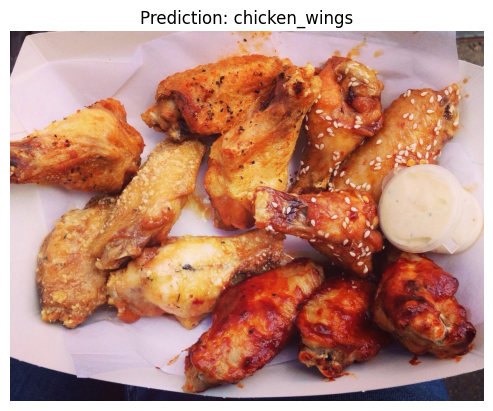

In [96]:
predict(image_path='/content/custom_food_images/chicken_wings.jpeg',model=model)

In [97]:
custom_food_images = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]
custom_food_images

['custom_food_images/ramen.jpeg',
 'custom_food_images/sushi.jpeg',
 'custom_food_images/chicken_wings.jpeg',
 'custom_food_images/hamburger.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/steak.jpeg']

1/1 [==============================] - 0s 52ms/step


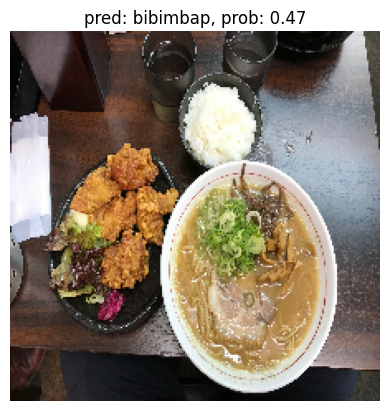

1/1 [==============================] - 0s 28ms/step


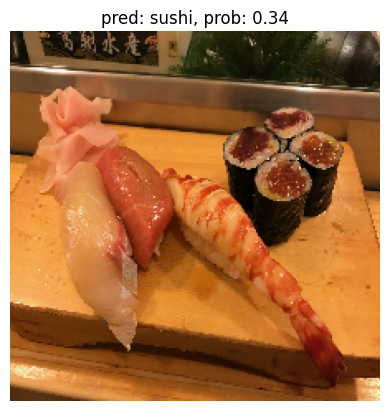

1/1 [==============================] - 0s 45ms/step


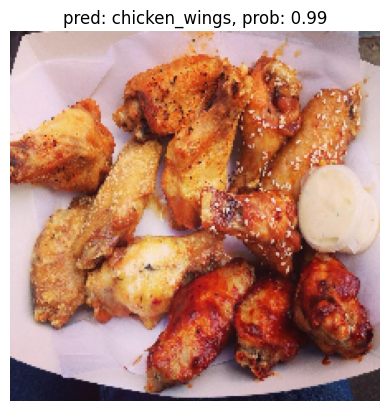

1/1 [==============================] - 0s 28ms/step


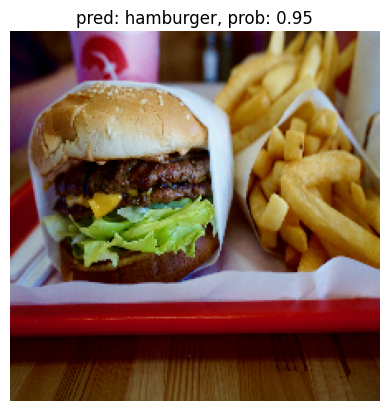

1/1 [==============================] - 0s 28ms/step


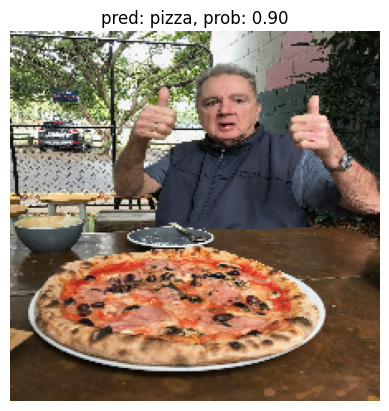

1/1 [==============================] - 0s 30ms/step


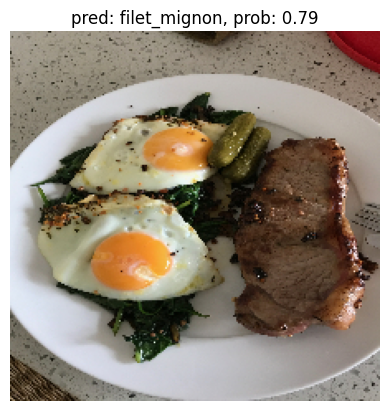

In [106]:
for img in custom_food_images:
  img = load_and_prep_image(img, scale=False) # load in target image and turn it into tensor
  pred_prob = model.predict(tf.expand_dims(img, axis=0)) # make prediction on image with shape [None, 224, 224, 3]
  pred_class = class_names[pred_prob.argmax()] # find the predicted class label
  # Plot the image with appropriate annotations
  plt.figure()
  plt.imshow(img/255.) # imshow() requires float inputs to be normalized
  plt.title(f"pred: {pred_class}, prob: {pred_prob.max():.2f}")
  plt.axis(False)
  plt.show()

1/1 [==============================] - 0s 40ms/step


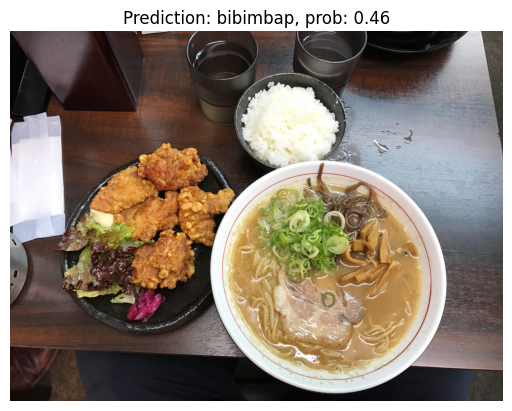

1/1 [==============================] - 0s 28ms/step


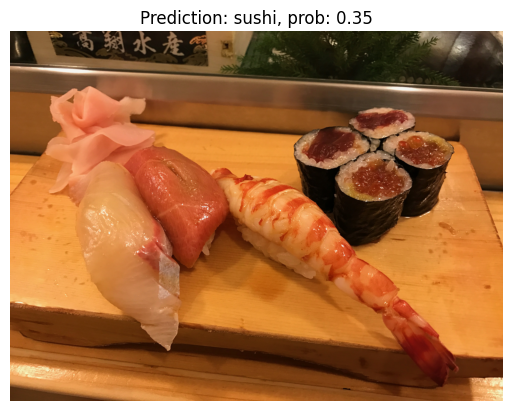

1/1 [==============================] - 0s 27ms/step


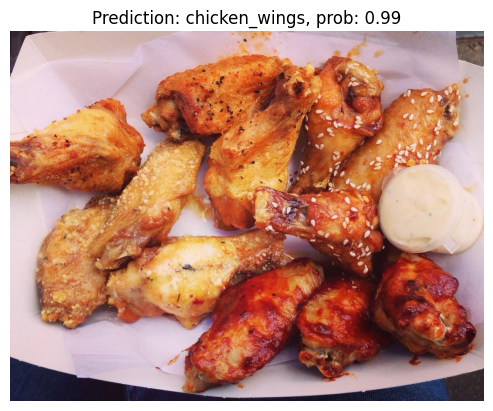

1/1 [==============================] - 0s 29ms/step


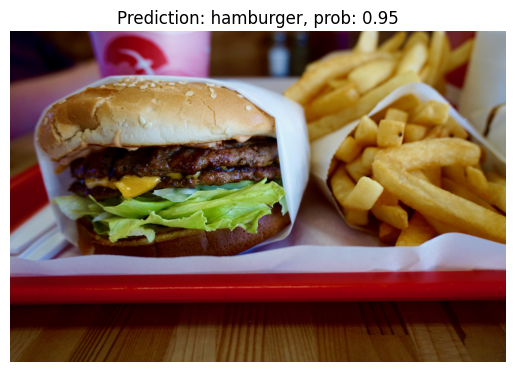

1/1 [==============================] - 0s 43ms/step


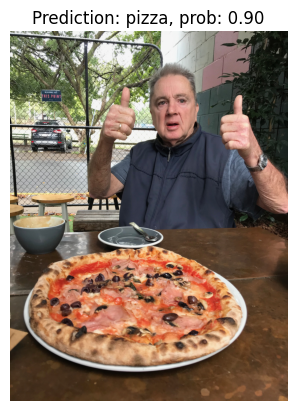

1/1 [==============================] - 0s 40ms/step


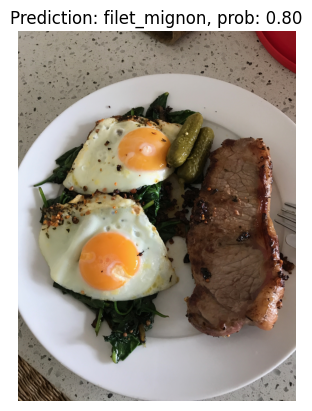

In [105]:
for img in custom_food_images:
  predict(img,model=model)